<a href="https://colab.research.google.com/github/tkasperek/Detectron2_-_GC10-DET_Pascal_VOC_dataset/blob/master/_Detectron2___GC10_DET_Pascal_VOC_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detectron2 - train with custom VOC dataset

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">



In [ ]:
on_local = False
on_colab = True

# local Init

In [ ]:
if on_local:
  import os
  os.environ['CUDA_VISIBLE_DEVICES'] = '0'

  import matplotlib.pyplot as plt
  def cv2_imshow(x):
      plt.imshow(x[...,::-1])
      plt.show()

  dataset_path = "/your_dataset_path"

# Colab init

In [ ]:
if on_colab:
  # install dependencies: 
  !pip install pyyaml==5.1 pycocotools>=2.0.1
  import torch, torchvision
  print(torch.__version__, torch.cuda.is_available())
  !gcc --version
  # opencv is pre-installed on colab

  # install detectron2: (Colab has CUDA 10.1 + torch 1.7)
  # See https://detectron2.readthedocs.io/tutorials/install.html for instructions
  assert torch.__version__.startswith("1.6")
  !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

  from google.colab.patches import cv2_imshow

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 2.4MB/s 
     |████████████████████████████████| 2.2MB 3.1MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200716-cp36-none-any.whl size=42325 sha256=0bd6f8f09c601304905b0ead279298c519c81f18adcd553bb05819a77f2b9492
  Stored in directory: /root/.cache/pip/wheels/81/99/f4/42a6bef61c07b3d78dfe6d7ebff259444c4526504cf72378d7
Successfully built fvcore
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [ ]:
if on_colab:
  #run this cell to mount GDrive
  from google.colab import drive
  drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
if on_colab:
  dataset_path = "drive/My Drive/Colab Notebooks/data/GC10-DET"

# Imports

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset

## Prepare the dataset

In [ ]:
# functions for custom dataset
# baed on:
# https://github.com/jagin/detectron2-licenseplates/blob/master/licenseplates/dataset.py
#    https://medium.com/deepvisionguru/train-license-plates-detection-model-using-detectron2-dd166154f604
# https://towardsdatascience.com/how-to-train-detectron2-on-custom-object-detection-data-be9d1c233e4
#    https://colab.research.google.com/drive/1-TNOcPm3Jr3fOJG8rnGT9gh60mHUsvaW#scrollTo=wXisIbT1Zqou

#DATASET source:
# https://www.mdpi.com/1424-8220/20/6/1562
# from: Deep Metallic Surface Defect Detection: The New Benchmark and Detection Network
# by Xiaoming LvOrcID,Fajie Duan *,Jia-jia JiangOrcID,Xiao Fu andLin Gan

CLASS_NAMES = [
    '1_chongkong',
    '2_hanfeng',
    '3_yueyawan',
    '4_shuiban',
    '5_youban',
    '6_siban',
    '7_yiwu',
    '8_yahen',
    '9_zhehen',
    '10_yaozhed',
]

def load_voc_instances(dirname: str, split: str):
    """
    Load VOC detection annotations to Detectron2 format.
    Args:
        dirname: Contain "Annotations", "JPEGImages"
        split (str): one of "train", "test"
    """
    with PathManager.open(os.path.join(dirname, split + ".txt")) as f:
        fileids = np.loadtxt(f, dtype=np.str)

    dicts = []
    for fileid in fileids:
        anno_file = os.path.join(dirname, "Annotations", fileid + ".xml")
        jpeg_file = os.path.join(dirname, "JPEGImages", fileid + ".jpg")

        tree = ET.parse(anno_file)

        r = {
            "file_name": jpeg_file,
            "image_id": fileid,
            "height": int(tree.findall("./size/height")[0].text),
            "width": int(tree.findall("./size/width")[0].text),
        }
        instances = []

        for obj in tree.findall("object"):
            cls = obj.find("name").text
            bbox = obj.find("bndbox")
            bbox = [float(bbox.find(x).text) for x in ["xmin", "ymin", "xmax", "ymax"]]
            instances.append(
                {"category_id": CLASS_NAMES.index(cls), "bbox": bbox, "bbox_mode": BoxMode.XYXY_ABS}
            )
        r["annotations"] = instances
        dicts.append(r)
    return dicts


def register_voc(name, dirname, split):
    DatasetCatalog.register(name,
                            lambda: load_voc_instances(dirname, split))
    MetadataCatalog.get(name).set(thing_classes=CLASS_NAMES,
                                  dirname=dirname,
                                  split=split)

Register VOC dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).


In [ ]:
from fvcore.common.file_io import PathManager
import xml.etree.ElementTree as ET
from detectron2.structures import BoxMode

dataset_name = "my_custom_voc_2_"
train_subset = "trainval"
test_subset = "test"

dataset_name_train = dataset_name + train_subset
split_path = 'ImageSets/Main/' + train_subset
register_voc(dataset_name_train, dataset_path, split_path)

dataset_name_test = dataset_name + test_subset
split_path = 'ImageSets/Main/' + test_subset
register_voc(dataset_name_test, dataset_path, split_path)

In [ ]:
dataset_metadata = MetadataCatalog.get(dataset_name_train)
dataset_dicts = DatasetCatalog.get(dataset_name_train)

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



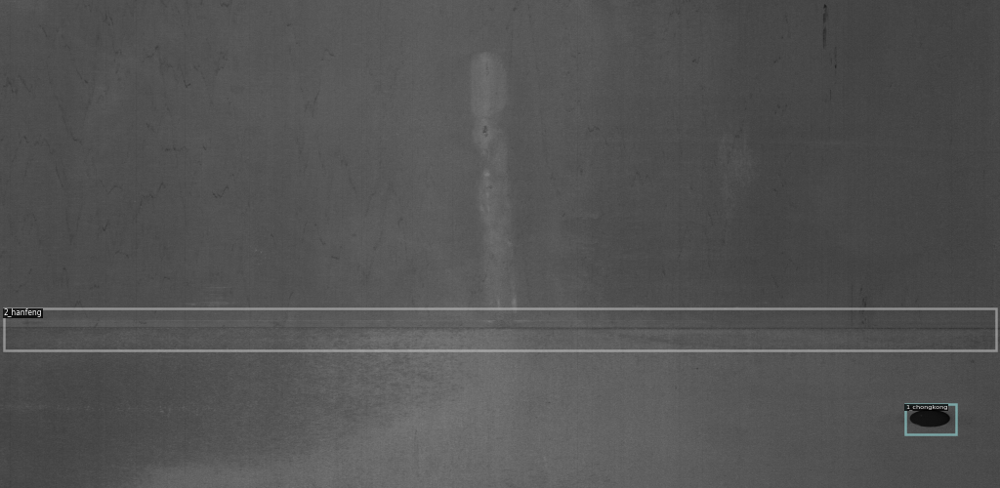

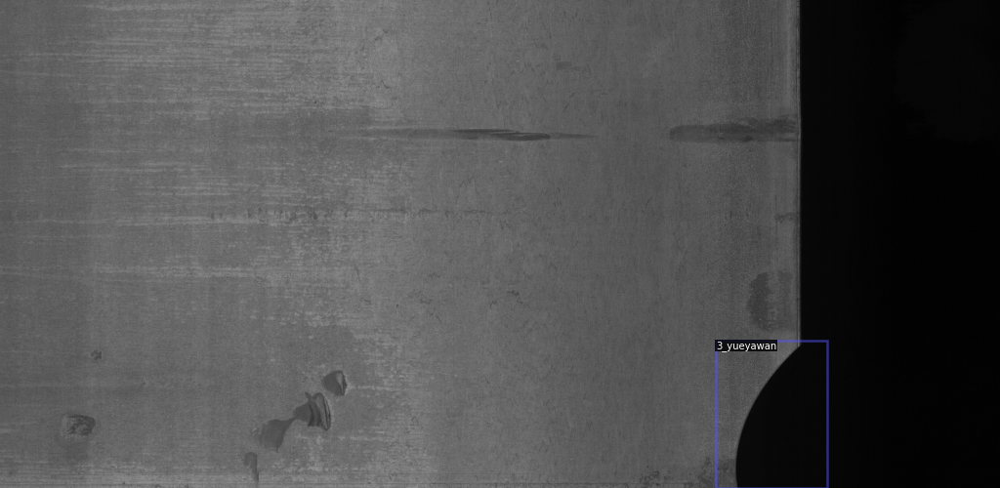

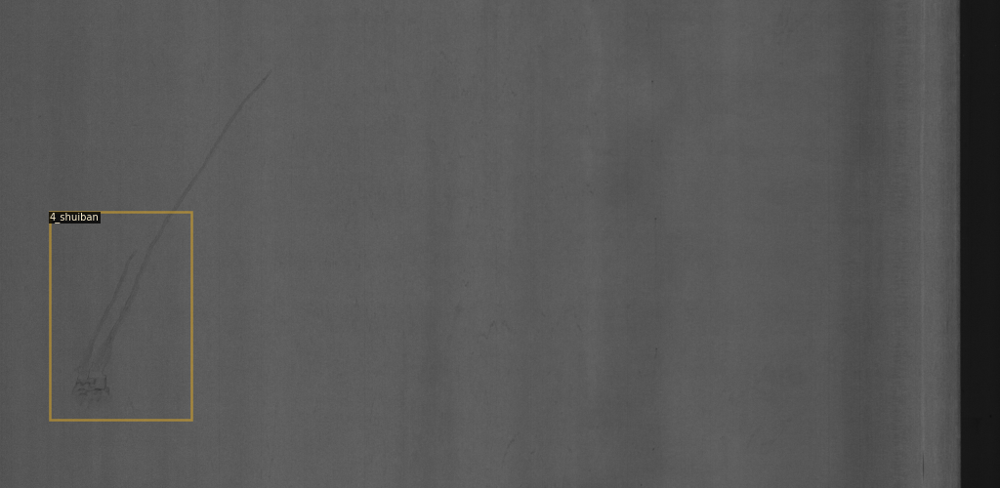

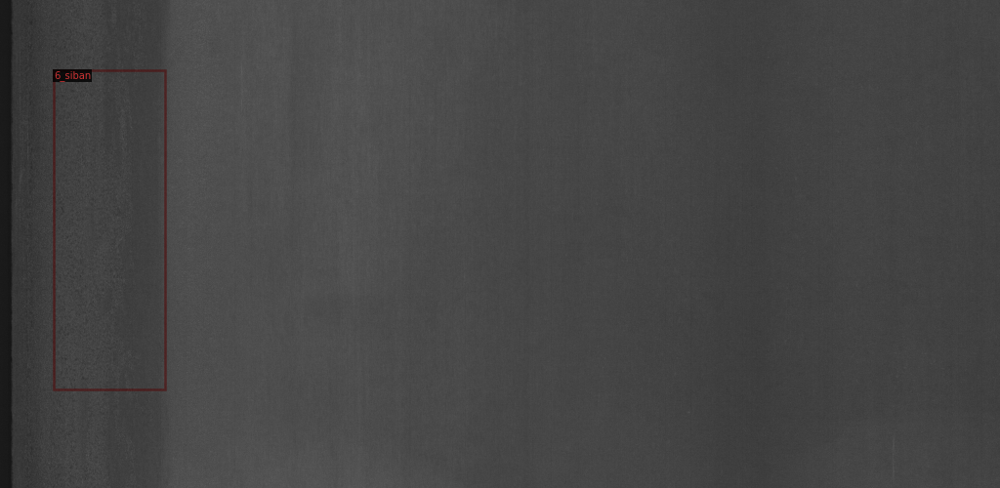

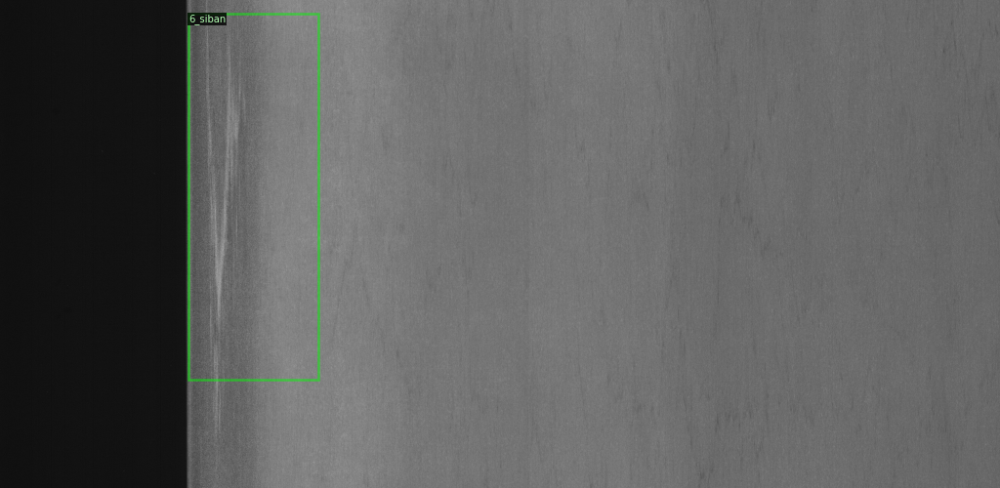

In [ ]:
nr_of_samples = 5
scale = 0.5

for d in random.sample(dataset_dicts, nr_of_samples):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=dataset_metadata, scale = scale)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
# in case of error:"module 'PIL.TiffTags' has no attribute 'IFD'" restart runtime and repeat all above

## Train!

Now, let's fine-tune a COCO-pretrained retinanet_R_50_FPN_3x model on your custom dataset. It takes ~... minutes to train ... iterations on Colab's K80 GPU, or ~... minutes on a P100 GPU.


In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

In [ ]:
class MyTrainer(DefaultTrainer):
    
    @classmethod
    def build_evaluator(cls, cfg, dataset_name_train, output_folder=None):
        """
        Create evaluator(s) for a given dataset.
        This uses the special metadata "evaluator_type" associated with each builtin dataset.
        For your own dataset, you can simply create an evaluator manually in your
        script and do not have to worry about the hacky if-else logic here.
        """
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, f"inference_{cfg.myEPOCH:03d}")
            cfg.myEPOCH += 1
        return COCOEvaluator(dataset_name_train, cfg, True, output_folder)

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))

cfg.DATASETS.TRAIN = (dataset_name_train, )
cfg.DATASETS.TEST = (dataset_name_test, )

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml")  # Let training initialize from model zoo

cfg.myEPOCH = 0

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR

cfg.SOLVER.MAX_ITER = 1824    # nr of iterations (training samples)

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)

cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(CLASS_NAMES)  # nr of classes for R-CNN
cfg.MODEL.RETINANET.NUM_CLASSES = len(CLASS_NAMES)  # nr of classes for RetinaNet

cfg.TEST.EVAL_PERIOD = 1 + cfg.SOLVER.MAX_ITER // 5

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = MyTrainer(cfg)

Loading config /usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


[08/30 16:17:16 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

## Start training

In [ ]:
trainer.resume_or_load(resume=False)
trainer.train()

model_final_5bd44e.pkl: 152MB [00:05, 27.3MB/s]                           
Skip loading parameter 'head.cls_score.weight' to the model due to incompatible shapes: (720, 256, 3, 3) in the checkpoint but (90, 256, 3, 3) in the model! You might want to double check if this is expected.
Skip loading parameter 'head.cls_score.bias' to the model due to incompatible shapes: (720,) in the checkpoint but (90,) in the model! You might want to double check if this is expected.


[08/30 16:18:45 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


[08/30 16:18:56 d2.utils.events]:  eta: 0:14:04  iter: 19  total_loss: 1.760  loss_cls: 1.046  loss_box_reg: 0.673  time: 0.4681  data_time: 0.0488  lr: 0.000005  max_mem: 2216M
[08/30 16:19:05 d2.utils.events]:  eta: 0:13:56  iter: 39  total_loss: 1.820  loss_cls: 1.072  loss_box_reg: 0.667  time: 0.4694  data_time: 0.0142  lr: 0.000010  max_mem: 2216M
[08/30 16:19:15 d2.utils.events]:  eta: 0:13:54  iter: 59  total_loss: 1.433  loss_cls: 0.899  loss_box_reg: 0.538  time: 0.4724  data_time: 0.0224  lr: 0.000015  max_mem: 2216M
[08/30 16:19:25 d2.utils.events]:  eta: 0:13:52  iter: 79  total_loss: 1.652  loss_cls: 1.105  loss_box_reg: 0.624  time: 0.4722  data_time: 0.0131  lr: 0.000020  max_mem: 2216M
[08/30 16:19:34 d2.utils.events]:  eta: 0:13:44  iter: 99  total_loss: 1.627  loss_cls: 1.136  loss_box_reg: 0.583  time: 0.4759  data_time: 0.0104  lr: 0.000025  max_mem: 2216M
[08/30 16:19:44 d2.utils.events]:  eta: 0:13:36  iter: 119  total_loss: 1.669  loss_cls: 1.139  loss_box_reg: 

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the test dataset. First, let's create a predictor using the model we just trained:

In [ ]:
# cfg already contains everything we've set previously. Now we changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0   # custom testing threshold for R-CNN
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.4    # custom testing threshold for RetinaNet
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

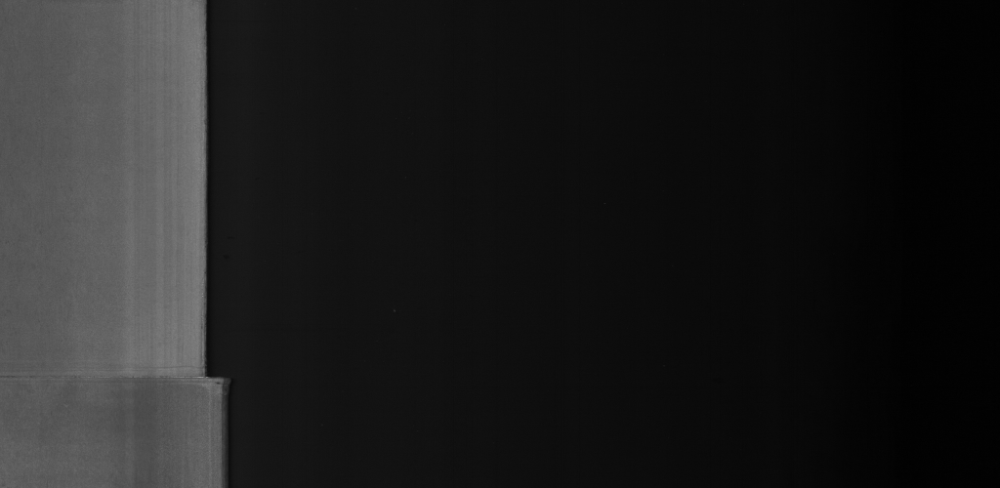

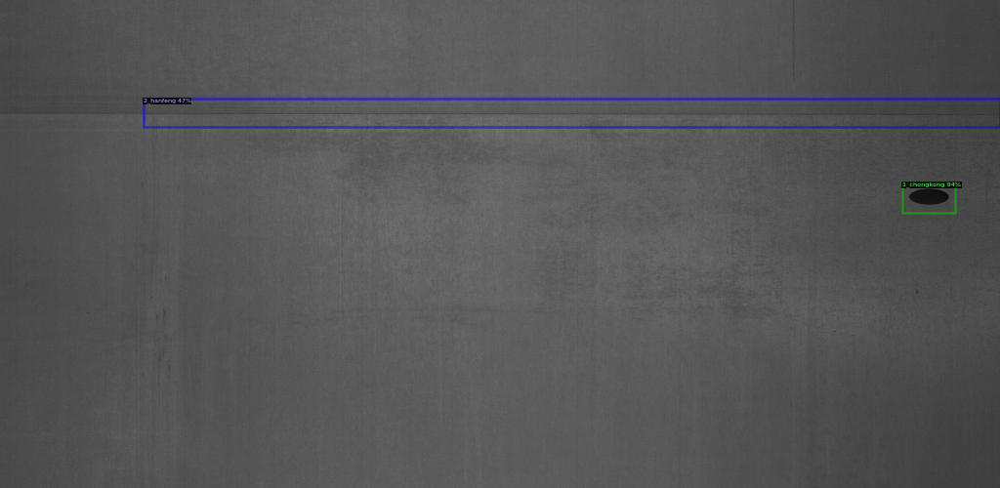

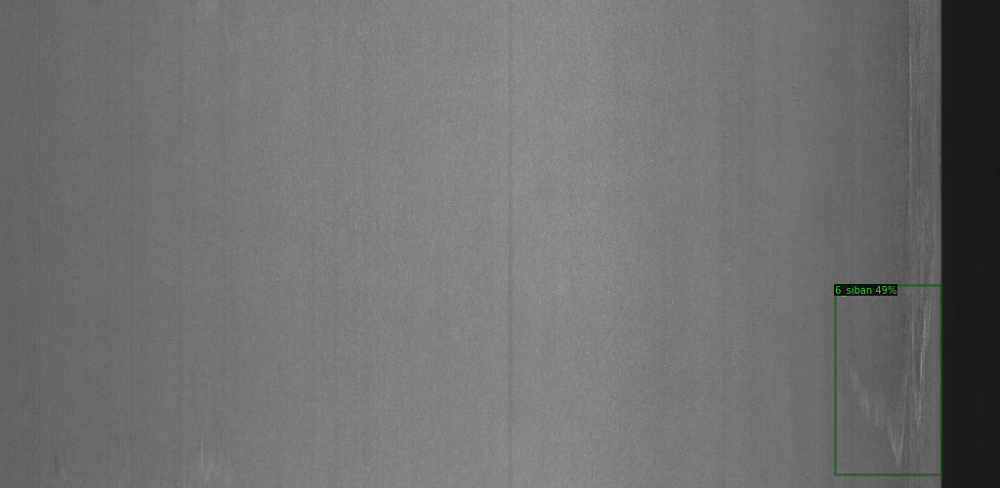

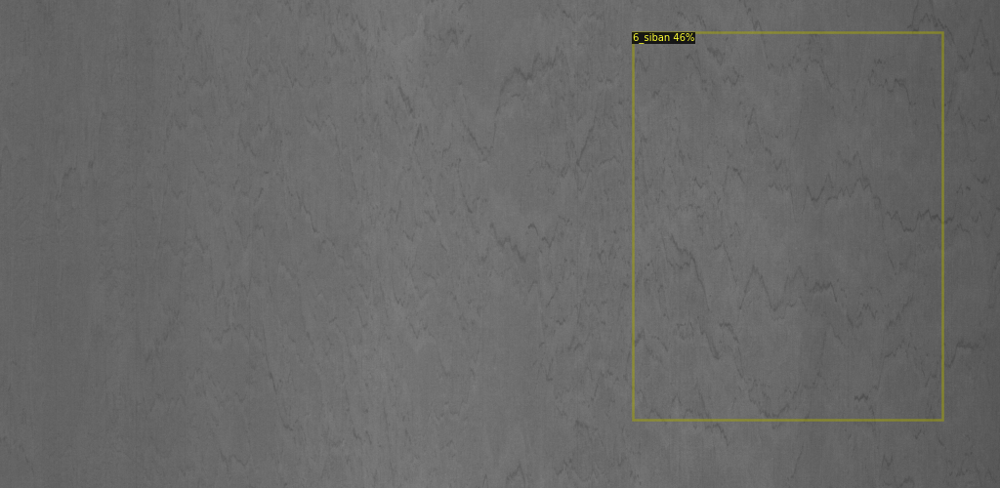

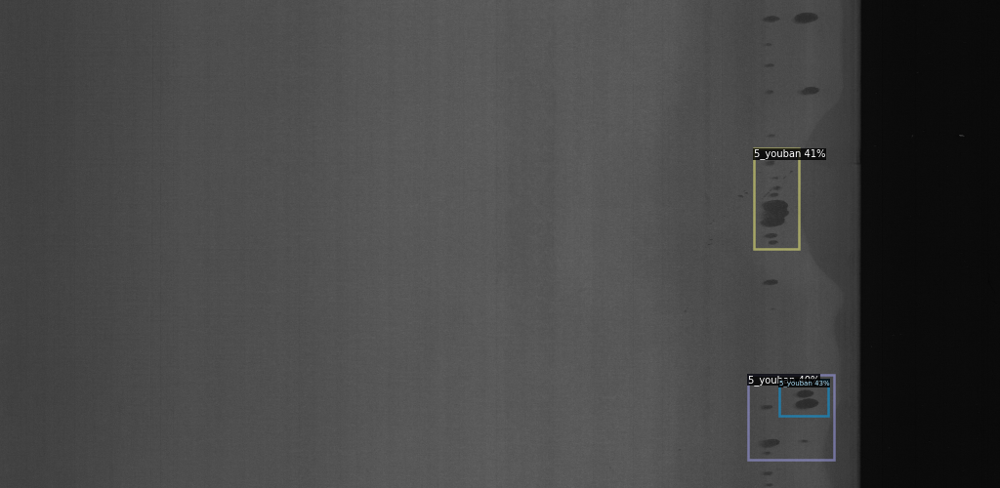

In [ ]:
from detectron2.utils.visualizer import ColorMode

dataset_dicts = DatasetCatalog.get(dataset_name_test)
dataset_metadata = MetadataCatalog.get(dataset_name_test)

for d in random.sample(dataset_dicts, nr_of_samples):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata = dataset_metadata,
                   scale = scale, 
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~... .

In [ ]:
from detectron2.evaluation import inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator(dataset_name_test, cfg, False, output_dir="./output/inference_final")
val_loader = build_detection_test_loader(cfg, dataset_name_test)
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[08/30 16:48:46 d2.data.common]: Serializing 456 elements to byte tensors and concatenating them all ...
[08/30 16:48:46 d2.data.common]: Serialized dataset takes 0.22 MiB
[08/30 16:48:46 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/30 16:48:46 d2.evaluation.evaluator]: Start inference on 456 images
[08/30 16:48:48 d2.evaluation.evaluator]: Inference done 11/456. 0.1155 s / img. ETA=0:00:56
[08/30 16:48:53 d2.evaluation.evaluator]: Inference done 53/456. 0.1169 s / img. ETA=0:00:49
[08/30 16:48:58 d2.evaluation.evaluator]: Inference done 95/456. 0.1180 s / img. ETA=0:00:43
[08/30 16:49:03 d2.evaluation.evaluator]: Inference done 136/456. 0.1180 s / img. ETA=0:00:39
[08/30 16:49:08 d2.evaluation.evaluator]: Inference done 177/456. 0.1185 s / img. ETA=0:00:34
[08/30 16:49:14 d2.evaluation.evaluator]: Inference done 217/456. 0.1187 s / img. ETA=0:00:29
[08/30 16:49:19 d2.evaluation.eva

# other datasets
https://www.kaggle.com/c/airbus-ship-detection/data
https://github.com/chrieke/awesome-satellite-imagery-datasets
https://public.roboflow.com/object-detection/aerial-maritime/1
